# 1.Import the necessary library

In [1]:
!pip install git+https://github.com/jacobgil/pytorch-grad-cam.git -q

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 95.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 76.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 43.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 9.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 86.6 MB/s eta 0:00:00


In [2]:
import os
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from tqdm import tqdm

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix,ConfusionMatrixDisplay

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split,WeightedRandomSampler , Dataset
import timm


from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import warnings
warnings.filterwarnings("ignore")

# 2.Prepare data for training

In [3]:
#Set random seed for reproducibility
random.seed(42)
torch.manual_seed(42)
np.random.seed(42)

In [4]:
#Define original directories
original_dirs = {'Calculus': '/kaggle/input/oral-diseases/Calculus/Calculus',
               'Caries' : '/kaggle/input/oral-diseases/Data caries/Data caries/caries augmented data set/preview',
               'Gingivitis' : '/kaggle/input/oral-diseases/Gingivitis/Gingivitis',
               'Mouth Ulcer' : '/kaggle/input/oral-diseases/Mouth Ulcer/Mouth Ulcer/Mouth_Ulcer_augmented_DataSet/preview',
               'Tooth Discoloration' : '/kaggle/input/oral-diseases/Tooth Discoloration/Tooth Discoloration /Tooth_discoloration_augmented_dataser/preview',
               'hypodontia' : '/kaggle/input/oral-diseases/hypodontia/hypodontia',
               'Oral Cancer':'/kaggle/input/teeth-disease-s/Teeth_Dataset_s/Oral Cancer',
               'Oral Lichen Planus':'/kaggle/input/teeth-disease-s/Teeth_Dataset_s/Oral Lichen Planus'}

#Define target base directory
base_dir = "/kaggle/working/dataset"
splits = ['train','val','test']
classes = list(original_dirs.keys())

#Create target directories
for split in splits:
    for class_name in classes :
        os.makedirs(os.path.join(base_dir,split,class_name),exist_ok = True)

#Function to copy and split images
def copy_and_transfer_images(class_name ,image_paths):
    train_path , test_path = train_test_split(image_paths , test_size = 0.1, random_state =42 )
    train_path , val_path = train_test_split(train_path , test_size = 0.15, random_state =42 )
    split_path = {'train': train_path , 'val' : val_path , 'test' : test_path}

    for split, paths in split_path.items():
        for img_path in paths :
            target_path = os.path.join(base_dir , split , class_name , os.path.basename(img_path))
            shutil.copy(img_path, target_path)

#Organize dataset
for class_name , original_dir in original_dirs.items():
    image_paths = [os.path.join(root,file) for root, _ , files in os.walk(original_dir)
                   for file in files if file.endswith(('.jpeg','.jpg','.png'))]
    if image_paths:
        copy_and_transfer_images(class_name ,image_paths)

print("Images organized successfully.")

Images organized successfully.


# 3.Displaying Random Images from train

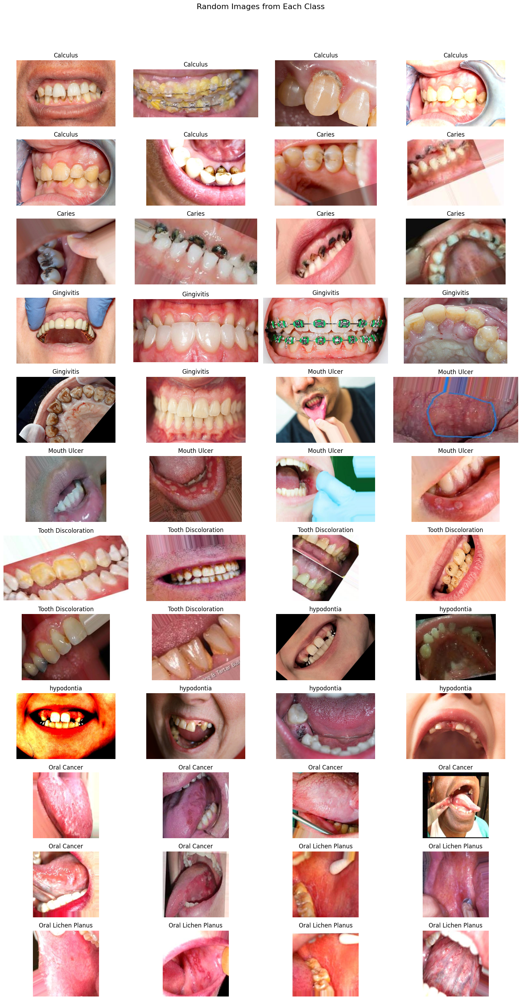

In [5]:
# Number of images to display per class and per row
num_images_per_class = 6
num_images_per_row = 4

# Function to fetch random images from a given directory
def get_random_images(directory , num_images):
    """
    Returns a list of random image paths from the given directory.
    Supports jpg, jpeg, and png formats.
    """
    all_images = [os.path.join(directory, image) for image in os.listdir(directory)
                  if image.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if len(all_images) <= num_images:
        return all_images

    return random.sample(all_images,num_images)

# Calculate the number of rows needed for displaying images
total_images = len(classes)*num_images_per_class
num_rows = (total_images + num_images_per_row - 1)// num_images_per_row

# Create the figure and subplots
fig, axes = plt.subplots(num_rows, num_images_per_row ,figsize = (15,num_rows*2.5) )
fig.suptitle("Random Images from Each Class", fontsize=16)

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Keep track of the subplot index
image_index = 0

# Loop through each class and display random images
for class_name in classes:
    class_path = os.path.join(base_dir,'train',class_name)
    random_images = get_random_images(class_path,num_images_per_class)

    for img_path in random_images:
        if image_index <len(axes):
            image = Image.open(img_path)
            axes[image_index].imshow(image)
            axes[image_index].set_title(class_name)
            axes[image_index].axis('off')
            image_index += 1


# Hide any remaining unused subplots
for i in range(image_index, len(axes)):
    axes[i].axis('off')

# Adjust spacing and show the plot
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

# 4.Data distribution between training,validing,testing for each class

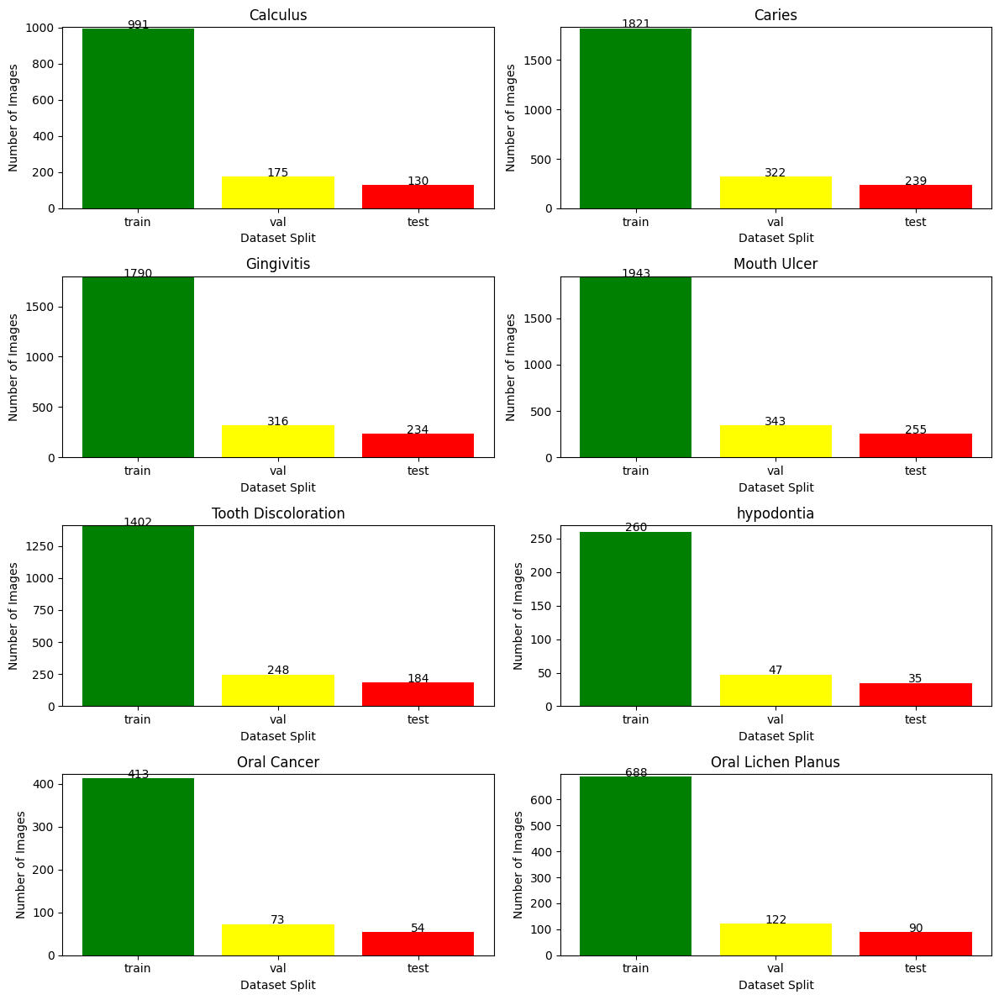

In [6]:
#  Function to count the number of images in each split (train, val, test) for a given class
def count_images(base_dir, class_name):
    counts = {}
    for split in ["train", "val", "test"]:
        split_dir = os.path.join(base_dir, split, class_name)
        counts[split] = len(os.listdir(split_dir))
    return counts

# Count images for each class and store results in a dictionary
class_split_counts = {class_name: count_images(base_dir, class_name) for class_name in classes}

# Create subplots: 3 rows × 2 columns (total 6 plots)
fig, axes = plt.subplots(4, 2, figsize=(12, 12))
axes = axes.flatten()  # Flatten the 2D array of axes into a 1D array for easy access

# Loop through the first 6 classes and create bar plots
for idx, class_name in enumerate(classes[:8]):
    counts = class_split_counts[class_name]
    ax = axes[idx]

    # Create a bar chart for this class (Train, Val, Test)
    ax.bar(counts.keys(), counts.values(), color= ['green','yellow','red'])

    # Add titles and labels
    ax.set_title(f"{class_name}", fontsize=12)
    ax.set_xlabel("Dataset Split")
    ax.set_ylabel("Number of Images")
    ax.set_ylim(0, max(counts.values()) + 10)  # Set y-axis limit slightly above max for spacing

    # Display the count values above the bars
    for i, val in enumerate(counts.values()):
        ax.text(i, val + 1, str(val), ha="center", fontsize=10)

# Hide any unused subplots if there are fewer than 6 classes
for j in range(len(classes[:8]), len(axes)):
    axes[j].axis("off")

# Adjust layout for better visualization
plt.tight_layout()
plt.show()


# 5.Data augmentation

In [7]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

# ===========================
# TRAINING TRANSFORMATIONS
# ===========================
train_transforms = A.Compose([
    # Randomly crop and resize the image to focus on important regions like teeth and gums
    A.RandomResizedCrop(
        size =(300,300), scale=(0.95, 1.0), p=1.0
    ),

    # Randomly flip the image horizontally or vertically to simulate different viewing angles
    A.HorizontalFlip(p=0.4),
    A.VerticalFlip(p=0.1),

    # Slight shift, scaling, and rotation to simulate different head positions
    A.ShiftScaleRotate(
        shift_limit=0.03,      # up to ±3% image shift
        scale_limit=0.1,      # up to ±10% zoom in/out
        rotate_limit=15,        # max ±15 degrees rotation
        border_mode=0,         # fill empty areas with black pixels
        p=0.5
    ),

    # Adjust brightness and contrast to make infections, tissues, and gums clearer
    A.RandomBrightnessContrast(
        brightness_limit=0.12,  # ±12% brightness adjustment
        contrast_limit=0.15,   # ±15% contrast adjustment
        p=0.5
    ),

    # Apply CLAHE to locally enhance image contrast and highlight teeth/gum problems
    A.CLAHE(
        clip_limit=2.5,
        tile_grid_size=(10, 10),
        p=0.5
    ),

    # Slight color variations to simulate different lighting conditions in images
    A.HueSaturationValue(
        hue_shift_limit=5,     # small hue shift
        sat_shift_limit=15,    # adjust saturation
        val_shift_limit=10,    # adjust brightness
        p=0.5
    ),

        # Random blur/sharpen (helps model generalize under noise)
    A.OneOf([
        A.MotionBlur(p=0.2),
        A.MedianBlur(blur_limit=3, p=0.2),
        A.GaussianBlur(blur_limit=3, p=0.2),
        A.Sharpen(p=0.2),
    ], p=0.2),

    # Normalize image based on ImageNet statistics → suitable for InceptionV3 / EfficientNet-B3
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),

    # Convert image to PyTorch tensor format (C, H, W)
    ToTensorV2(),
], p=1.0)

# ===========================
# VALIDATION TRANSFORMATIONS
# ===========================
val_transforms = A.Compose([
    # Resize image without random cropping to keep validation images consistent
    A.Resize(height=300, width=300),

    # Normalize using the same ImageNet statistics as training
    A.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),

    # Convert image to PyTorch tensor format
    ToTensorV2(),
], p=1.0)



# 6.Create datasets and dataloader

In [8]:
# Custom Dataset to integrate Albumentations
class CustomImageDataset(Dataset):
    def __init__(self, image_paths, labels, classes,transform=None):
        self.image_paths = image_paths
        self.classes = classes
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB")
        label = self.labels[idx]
        img = np.array(img)

        if self.transform:
            img = self.transform(image=img)["image"]

        return img, label

In [9]:
# Define directories
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Use ImageFolder to read image paths and labels automatically
train_data = ImageFolder(root=train_dir)
val_data = ImageFolder(root=val_dir)
test_data = ImageFolder(root=test_dir)

classes = train_data.classes

# Extract image paths and labels from ImageFolder
train_image_paths = [path for path, _ in train_data.samples]
train_labels = [label for _, label in train_data.samples]

val_image_paths = [path for path, _ in val_data.samples]
val_labels = [label for _, label in val_data.samples]

test_image_paths = [path for path, _ in test_data.samples]
test_labels = [label for _, label in test_data.samples]

# Create datasets using CustomImageDataset + Albumentations
train_dataset = CustomImageDataset(train_image_paths, train_labels,classes, transform=train_transforms)
val_dataset = CustomImageDataset(val_image_paths, val_labels,classes, transform=val_transforms)
test_dataset = CustomImageDataset(test_image_paths, test_labels,classes, transform=val_transforms)

# Class counts (your data)
class_counts = np.array([991, 1821, 990, 1943,413,688, 1402, 260])

# Compute weights for each class
class_weights = 1. / torch.tensor(class_counts, dtype=torch.float)

# Map weights to each sample in the training dataset
train_labels_tensor = torch.tensor(train_labels, dtype=torch.long)
sample_weights = class_weights[train_labels_tensor]

# WeightedRandomSampler to handle class imbalance
sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=32 , sampler=sampler, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4, pin_memory=True)

In [10]:
def show_MRI_batch(dataloader,title = 'Batch of Images'):
    images ,labels = next(iter(dataloader))
    fig , axes = plt.subplots(4,8,figsize = (15,10))
    fig.suptitle(title)
    for i,ax in enumerate(axes.flatten()):
        if i <len(images):
            img = images[i].permute(1,2,0)
            ax.imshow(img)
            ax.set_title(train_dataset.classes[labels[i]])
            ax.axis('off')

    plt.show()

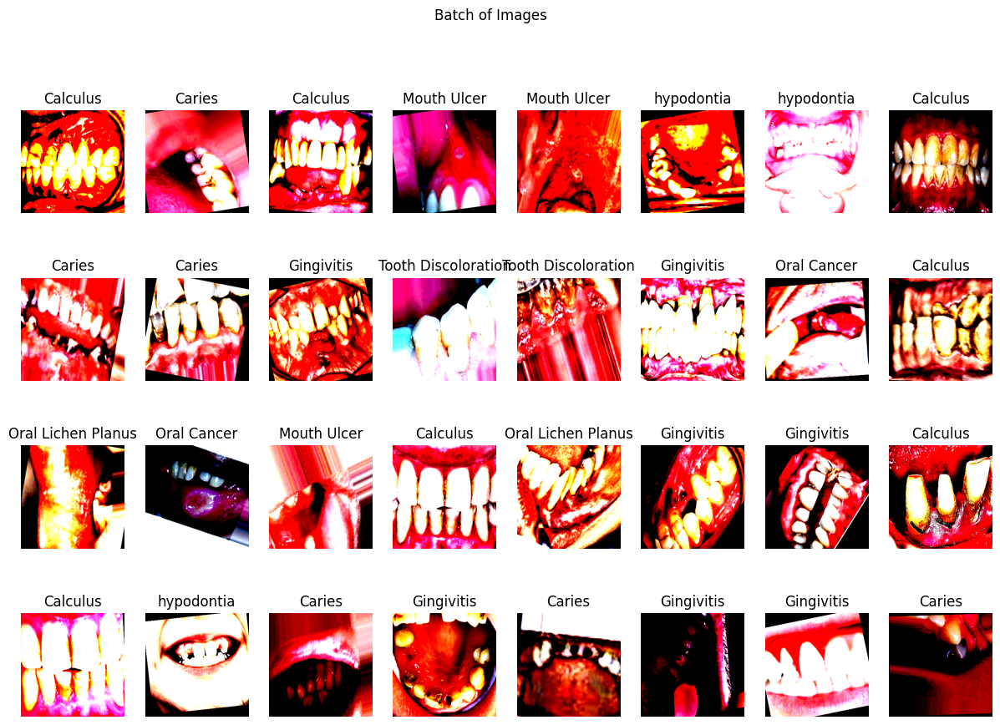

In [11]:
show_MRI_batch(train_loader)

# 7.Define model

In [12]:
class CustomEfficientnet(nn.Module):
    def __init__(self, num_classes):
        super(CustomEfficientnet,self).__init__()

        # Load pretrained efficientnetb3
        self.model = timm.create_model('efficientnet_b4',pretrained = True,drop_path_rate=0.15)

        # unFreeze layers
        for param in self.model.parameters():
            param.requires_grad = True

        # Replace the fully connected layer with a custom classifier
        in_features = self.model.classifier.in_features
        
        self.model.classifier = nn.Sequential(
            nn.Linear(in_features,1024),
            nn.BatchNorm1d(1024),
            nn.ReLU(),
            nn.Dropout(0.6),
            
            nn.Linear(1024,512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Dropout(0.5),
            
            nn.Linear(512,256),
            nn.BatchNorm1d(256),
            nn.ReLU(),
            nn.Dropout(0.4),
            
            nn.Linear(256,128),
            nn.BatchNorm1d(128),
            nn.ReLU(),
            nn.Dropout(0.4),
            
            nn.Linear(128,num_classes)
        )

    def forward(self,x):
        return self.model(x)


# 8.Initialize the model, loss function, and optimizer

In [13]:
# Number of images per class (your data)
class_counts = torch.tensor([990, 1821, 990, 1943,413,688,1402, 260], dtype=torch.float)

# Calculate class weights inversely proportional to class frequency
# Formula: weight = total_samples / (num_classes * class_count)
class_weights = 0
class_weights = class_counts.sum() / (len(class_counts) * class_counts)

# Move to GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class_weights = class_weights.to(device)

print("Class names:", classes,'\n')
print("Class Weights:", class_weights,'\n')


Class names: ['Calculus', 'Caries', 'Gingivitis', 'Mouth Ulcer', 'Oral Cancer', 'Oral Lichen Planus', 'Tooth Discoloration', 'hypodontia'] 

Class Weights: tensor([1.0741, 0.5840, 1.0741, 0.5473, 2.5748, 1.5456, 0.7585, 4.0899],
       device='cuda:0') 



In [14]:
num_classes = len(train_dataset.classes)
model = CustomEfficientnet(num_classes)
model.to(device)

optimizer = optim.AdamW(model.parameters(), lr = 0.001, weight_decay = 0.00001)
criterion = nn.CrossEntropyLoss(class_weights)
scheduler = ReduceLROnPlateau(optimizer , mode = 'min' , factor = 0.3 , patience = 2)

model.safetensors:   0%|          | 0.00/77.9M [00:00<?, ?B/s]

# 9.Training loop

In [15]:
num_epochs = 20

scaler = torch.cuda.amp.GradScaler()

best_model_wts = None
best_val_loss = float("inf")

train_loss_list = []
train_acc_list = []
val_loss_list = []
val_acc_list = []


for epoch in range(num_epochs):

    model.train()
    running_loss = 0.0
    train_correct = 0
    train_total = 0

    for images, labels in tqdm(train_loader):
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast():
            outputs = model(images)
            loss = criterion(outputs, labels)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        running_loss += loss.item()

        _, predicted = torch.max(outputs, 1)

        train_total += labels.size(0)
        train_correct += (predicted == labels).sum().item()

    avg_train_loss = running_loss / len(train_loader)
    train_accuracy = 100 * train_correct / train_total

    train_loss_list.append(avg_train_loss)
    train_acc_list.append(train_accuracy)


    model.eval()
    correct = 0
    total = 0
    val_loss = 0.0

    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for images, labels in tqdm(val_loader):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            loss = criterion(outputs, labels)
            val_loss += loss.item()

            _, predicted = torch.max(outputs, 1)

            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    avg_val_loss = val_loss / len(val_loader)
    accuracy = 100 * correct / total

    val_loss_list.append(avg_val_loss)
    val_acc_list.append(accuracy)

    scheduler.step(avg_val_loss)

    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_model_wts = model.state_dict().copy()
        torch.save(best_model_wts, "best_model.pth")
        print("✅ Model Saved! Best so far.")

    print(f"Epoch [{epoch+1}/{num_epochs}] "
      f"Train Loss: {avg_train_loss:.4f} | "
      f"Val Loss: {avg_val_loss:.4f} | "
      f"Train Accuracy: {train_accuracy:.2f}% | "
      f"Val Accuracy: {accuracy:.2f}% | "
      f"LR: {optimizer.param_groups[0]['lr']:.8f} |")

100%|██████████| 52/52 [00:06<00:00,  7.79it/s]


✅ Model Saved! Best so far.
Epoch [1/20] Train Loss: 0.8502 | Val Loss: 0.6812 | Train Accuracy: 54.27% | Val Accuracy: 71.81% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.95it/s]


✅ Model Saved! Best so far.
Epoch [2/20] Train Loss: 0.4168 | Val Loss: 0.3807 | Train Accuracy: 76.53% | Val Accuracy: 85.42% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.81it/s]


✅ Model Saved! Best so far.
Epoch [3/20] Train Loss: 0.3001 | Val Loss: 0.3384 | Train Accuracy: 84.92% | Val Accuracy: 86.15% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.94it/s]


✅ Model Saved! Best so far.
Epoch [4/20] Train Loss: 0.2553 | Val Loss: 0.2455 | Train Accuracy: 87.25% | Val Accuracy: 90.40% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.86it/s]


Epoch [5/20] Train Loss: 0.2296 | Val Loss: 0.3665 | Train Accuracy: 88.46% | Val Accuracy: 86.33% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.79it/s]


✅ Model Saved! Best so far.
Epoch [6/20] Train Loss: 0.2127 | Val Loss: 0.2113 | Train Accuracy: 88.99% | Val Accuracy: 89.67% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.89it/s]


Epoch [7/20] Train Loss: 0.1942 | Val Loss: 0.2163 | Train Accuracy: 90.43% | Val Accuracy: 90.40% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.93it/s]


Epoch [8/20] Train Loss: 0.1853 | Val Loss: 0.2146 | Train Accuracy: 90.48% | Val Accuracy: 89.91% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.88it/s]


✅ Model Saved! Best so far.
Epoch [9/20] Train Loss: 0.1692 | Val Loss: 0.1975 | Train Accuracy: 91.18% | Val Accuracy: 90.16% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.84it/s]


✅ Model Saved! Best so far.
Epoch [10/20] Train Loss: 0.1647 | Val Loss: 0.1927 | Train Accuracy: 91.30% | Val Accuracy: 91.68% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.87it/s]


✅ Model Saved! Best so far.
Epoch [11/20] Train Loss: 0.1654 | Val Loss: 0.1834 | Train Accuracy: 91.63% | Val Accuracy: 90.89% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.92it/s]


✅ Model Saved! Best so far.
Epoch [12/20] Train Loss: 0.1508 | Val Loss: 0.1681 | Train Accuracy: 91.28% | Val Accuracy: 91.49% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.80it/s]


Epoch [13/20] Train Loss: 0.1803 | Val Loss: 0.2140 | Train Accuracy: 90.80% | Val Accuracy: 90.16% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.99it/s]


Epoch [14/20] Train Loss: 0.1761 | Val Loss: 0.1806 | Train Accuracy: 91.18% | Val Accuracy: 90.64% | LR: 0.00100000 |


100%|██████████| 52/52 [00:06<00:00,  7.80it/s]


Epoch [15/20] Train Loss: 0.1399 | Val Loss: 0.1726 | Train Accuracy: 92.09% | Val Accuracy: 92.04% | LR: 0.00030000 |


100%|██████████| 52/52 [00:06<00:00,  7.82it/s]


✅ Model Saved! Best so far.
Epoch [16/20] Train Loss: 0.1167 | Val Loss: 0.1478 | Train Accuracy: 93.19% | Val Accuracy: 92.04% | LR: 0.00030000 |


100%|██████████| 52/52 [00:06<00:00,  7.82it/s]


Epoch [17/20] Train Loss: 0.1083 | Val Loss: 0.1514 | Train Accuracy: 93.31% | Val Accuracy: 91.98% | LR: 0.00030000 |


100%|██████████| 52/52 [00:06<00:00,  7.87it/s]


✅ Model Saved! Best so far.
Epoch [18/20] Train Loss: 0.0996 | Val Loss: 0.1465 | Train Accuracy: 94.05% | Val Accuracy: 92.28% | LR: 0.00030000 |


100%|██████████| 52/52 [00:06<00:00,  7.92it/s]


Epoch [19/20] Train Loss: 0.0957 | Val Loss: 0.1481 | Train Accuracy: 93.76% | Val Accuracy: 92.22% | LR: 0.00030000 |


100%|██████████| 52/52 [00:06<00:00,  7.91it/s]

Epoch [20/20] Train Loss: 0.0980 | Val Loss: 0.1543 | Train Accuracy: 93.73% | Val Accuracy: 92.41% | LR: 0.00030000 |


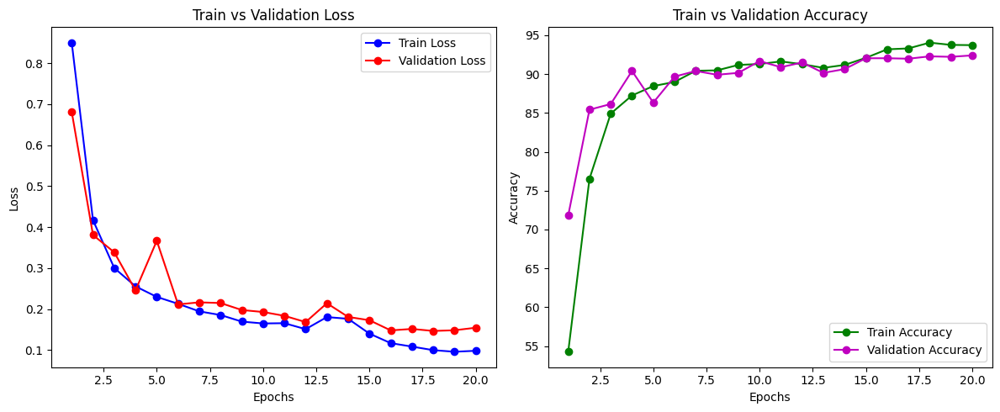

In [16]:
epochs = range(1, len(train_loss_list) + 1)

plt.figure(figsize=(12,5))

# Loss Plot
plt.subplot(1,2,1)
plt.plot(epochs, train_loss_list, 'b-o', label='Train Loss')
plt.plot(epochs, val_loss_list , 'r-o', label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Train vs Validation Loss')
plt.legend()

# Accuracy Plot
plt.subplot(1,2,2)
plt.plot(epochs, train_acc_list, 'g-o', label='Train Accuracy')
plt.plot(epochs, val_acc_list, 'm-o', label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Train vs Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

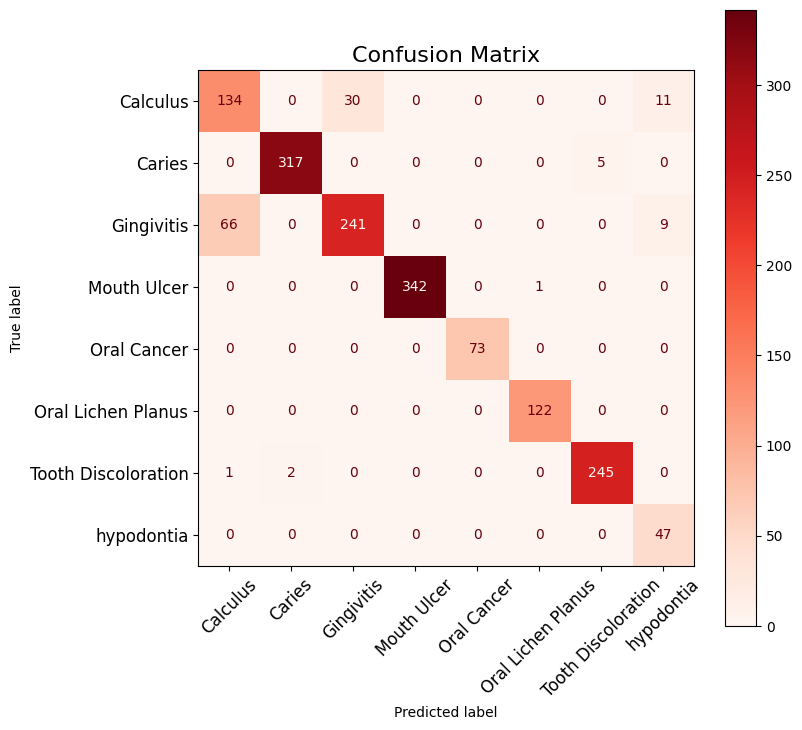

In [17]:
# Calculate confusion matrix
cm = confusion_matrix(all_labels, all_predictions)

# Display confusion matrix with larger figure
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 8))
disp.plot(ax=ax, cmap="Reds")
plt.title("Confusion Matrix", fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.show()


In [18]:
from sklearn.metrics import classification_report

print(classification_report(all_labels, all_predictions, target_names=classes))

                     precision    recall  f1-score   support

           Calculus       0.67      0.77      0.71       175
             Caries       0.99      0.98      0.99       322
         Gingivitis       0.89      0.76      0.82       316
        Mouth Ulcer       1.00      1.00      1.00       343
        Oral Cancer       1.00      1.00      1.00        73
 Oral Lichen Planus       0.99      1.00      1.00       122
Tooth Discoloration       0.98      0.99      0.98       248
         hypodontia       0.70      1.00      0.82        47

           accuracy                           0.92      1646
          macro avg       0.90      0.94      0.92      1646
       weighted avg       0.93      0.92      0.92      1646



# 10. Model evalution

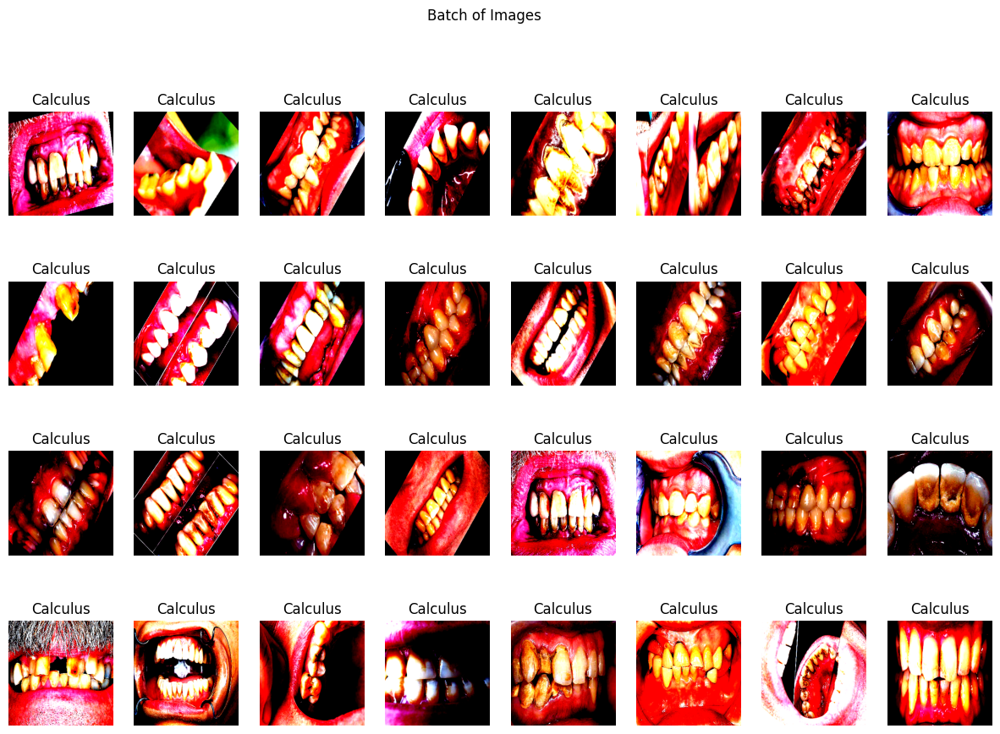

In [19]:
show_MRI_batch(test_loader)

In [20]:
best_model =  CustomEfficientnet(num_classes)
best_model.load_state_dict(torch.load("best_model.pth"))
best_model.to(device)
print('best_model ready')

best_model ready


In [21]:
best_model.eval()

test_labels = []
test_predictions = []

correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)


        outputs = best_model(images)
        _, predicted = torch.max(outputs, 1)

        test_labels.extend(labels.cpu().numpy())
        test_predictions.extend(predicted.cpu().numpy())

        correct += (predicted == labels).sum().item()
        total += labels.size(0)

accuracy = 100 * correct / total
print(f"Accuracy on Test Set: {accuracy:.2f}%")

Accuracy on Test Set: 93.20%


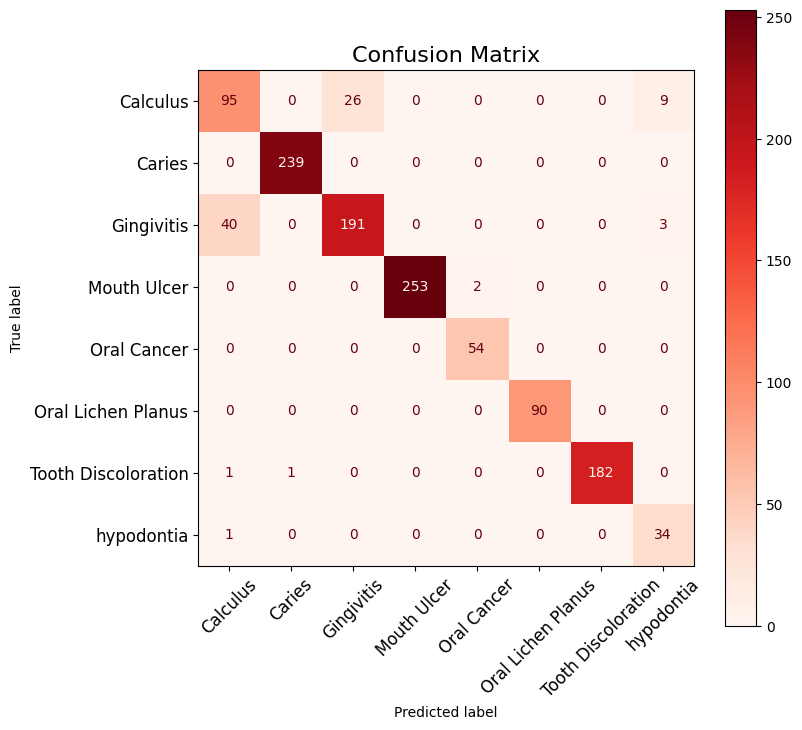

In [22]:
# Calculate confusion matrix
cm = confusion_matrix(test_labels, test_predictions)

# Display confusion matrix with larger figure
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=classes)
fig, ax = plt.subplots(figsize=(8, 8))
disp.plot(ax=ax, cmap="Reds")
plt.title("Confusion Matrix", fontsize=16)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)
plt.show()

In [23]:
print(classification_report(test_labels,test_predictions, target_names=classes))

                     precision    recall  f1-score   support

           Calculus       0.69      0.73      0.71       130
             Caries       1.00      1.00      1.00       239
         Gingivitis       0.88      0.82      0.85       234
        Mouth Ulcer       1.00      0.99      1.00       255
        Oral Cancer       0.96      1.00      0.98        54
 Oral Lichen Planus       1.00      1.00      1.00        90
Tooth Discoloration       1.00      0.99      0.99       184
         hypodontia       0.74      0.97      0.84        35

           accuracy                           0.93      1221
          macro avg       0.91      0.94      0.92      1221
       weighted avg       0.93      0.93      0.93      1221



# 11.Grad-CAM visualization

In [24]:
def visualize_grad_cam(image_paths, model, device, class_names):
    num_images = len(image_paths)
    num_rows = (num_images + 1) // 2
    plt.figure(figsize=(20, 5 * num_rows))
    
    # EfficientNet من timm: آخر بلوك conv 
    target_layer = model.model.blocks[-1]
    grad_cam = GradCAM(model=model, target_layers=[target_layer])
    
    for idx, image_path in enumerate(image_paths):
        input_image = Image.open(image_path).convert('RGB')
        preprocess = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                 std=[0.229, 0.224, 0.225]),
        ])
        input_tensor = preprocess(input_image).unsqueeze(0).to(device)
        
        grayscale_cam = grad_cam(input_tensor)[0]
        input_image_np = np.array(input_image.resize((224, 224))) / 255.0
        visualization = show_cam_on_image(input_image_np, grayscale_cam, use_rgb=True)
        
        outputs = model(input_tensor)
        _, predicted = torch.max(outputs, 1)
        predicted_class = class_names[predicted.item()]
        true_class = os.path.basename(os.path.dirname(image_path))
        title_color = 'green' if true_class == predicted_class else 'red'
        
        plt.subplot(num_rows, 4, 2 * idx + 1)
        plt.imshow(input_image_np)
        plt.title(f'True: {true_class}', fontsize=24, color=title_color)
        plt.axis('off')

        plt.subplot(num_rows, 4, 2 * idx + 2)
        plt.imshow(visualization)
        plt.title(f'Predicted: {predicted_class}', fontsize=24, color=title_color)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()


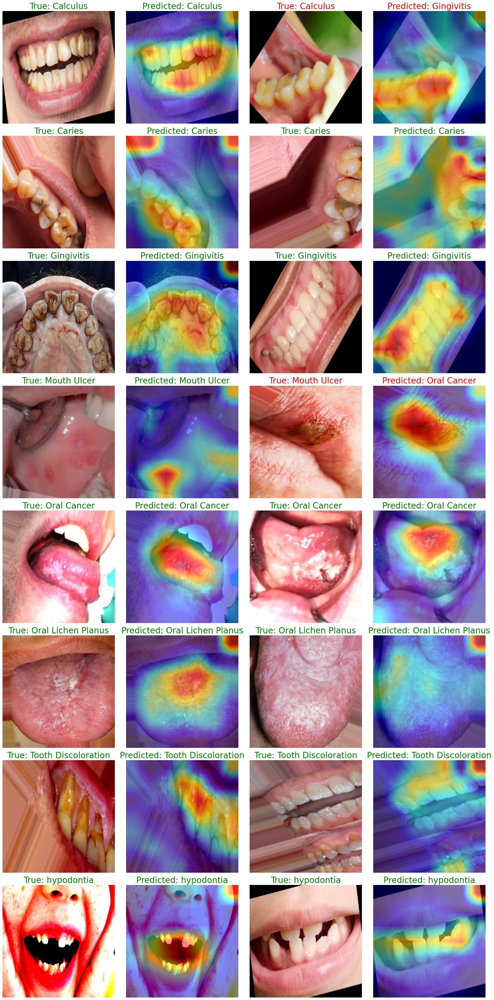

In [25]:
# Get random test images and visualize Grad-CAM
random_images = [os.path.join(test_dir, cls, random.choice(os.listdir(os.path.join(test_dir, cls)))) 
                 for cls in classes for _ in range(2)]
visualize_grad_cam(random_images, model, device, classes)